# Image Data Exploration and Dimensionality Reduction on Food Image

By: Jian Guo, 
     Huijun Wang,
     Jianye Liu,
     Jiaqing Ji

Reference: https://www.kaggle.com/kmader/food41

# 1.Business Understanding
The dataset contains more than 10,000 images of food, which belongs to 101 kinds.  The data has been reformatted as HDF5 and specifically Keras HDF5Matrix which allows them to be easily read in. And then they were transferred to PNG format to be analyzed. The end goal of analysis of this dataset would be to classify an unknown food image. For example, we can use our machine learning algorithm to recognize a image of burger to classify it to some related group. We can also compare two similar burgers to find the differences between them.
(https://www.kaggle.com/kmader/food41)

As people are becoming increasingly aware of the flavor and taste of food, the need for automatic food recognition systems has arisen. Not only can such systems provide the automatic recognition of food items to customers, but they can also help chefs or food tasting experts to know the popularity and new style of food, which is especially useful for them to grasp the trend of popular food and develop new dish. And it is also applicable for customers to recognize the classification of food, so that they can find their favorite food on different app or websites quickly. As a result, they can know what kind of food they like and how many restaurants supply this kind of food.
The idea is to make some food related applications like Yelp efficiently work for all users. We can use the image analysis to recognize whether location restaurants upload the images are correlated to their name. We can also decide the reviews of these food are correlated to images.

When you are travelling or living in a foreign country, you will miss the hometown taste or curious about the foreign food. Then, this kind of food recognition will help you live in a foreign country comfortably. You can upload the picture of the hometown food to the website or app, the food recognition system will tell you which restaurant are selling this food. And you may curious about the food which foreigners are eating or displaying on the restaurant wall. You can upload the picture to the website, and then this food recognition system will tell you the name of this food and send you some similar pictures of this food. 

As for chefs and food tasting experts, when they are reading newspaper or watching a cooking show, they must be curious about the top list of popular food and would like to know how to cook this kind of food and where to buy this kind of food. They can upload pictures of this food to the website or app, then they will know the variety of this food  and find the Food raw materials easily.

As for babies, they are unfamiliar with this world, this food recognition system will help them to recognize the classification of food and teach them how to say about the specific name of this food, such as soup, spring roll, beans and so on. In this way, babies can get familiar with the classification of food easily. 

In [3]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
from skimage.io import imshow
from sklearn.decomposition import PCA
import pickle
from ipywidgets import widgets  
import plotly
from plotly.graph_objs import Scatter, Marker, Layout, XAxis, YAxis, Bar, Line
from skimage.feature import daisy
from sklearn.decomposition import KernelPCA
from sklearn.metrics.pairwise import pairwise_distances
import copy
from ipywidgets import fixed
from sklearn.metrics import mean_squared_error
import seaborn as sns
from skimage import data, color, exposure
import warnings
warnings.simplefilter('ignore', DeprecationWarning)

# 2 Data Preparation

## 2.1 Read all images as numpy arrays

### 2.1.1 Load all images.

In [7]:
f=h5py.File('../food-images-food-101/food_c101_n10099_r64x64x3.h5','r')

In [8]:
category = f['category']
category_name = f['category_names']
images = f['images']
category = np.array(category)
category_name = np.array(category_name)
size = len(images)
images[0].shape

(64, 64, 3)

There're 10099 images, each image has 64 * 64 pixels, and is represented in RGB, that makes the shape of each image is (64, 64, 3). 
The shape of the Numpy Matrix is [10099, 4096, 3]. Which rows = 10099, columns = 64 × 64 = 4096, channels = 3.
According to the dataset information, there's 101 types of food totally.

In [60]:
type(images)

h5py._hl.dataset.Dataset

### 2.1.2 Save all the images to local. (Only run once.)

In [92]:
'''
from PIL import Image
import numpy as np

size = len(images)
for i in range(size):  
    iimg = Image.fromarray(images[i], 'RGB')
    iimg.save('food/' + str(i) + '.png')
'''

"\nfrom PIL import Image\nimport numpy as np\n\nsize = len(images)\nfor i in range(size):  \n    iimg = Image.fromarray(images[i], 'RGB')\n    iimg.save('food/' + str(i) + '.png')\n"

### 2.1.3 Turn to Grayscale

##### We show first eight pictures of food, and also show the grayscale representation of them.

In [96]:
# Represent images in Grayscale.
def rgb2gray(rgb ):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])
i_ = 1
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.axis('off')

for i in range(8):
    img = mpimg.imread('food/' + str(i) + '.png')     
    gray = rgb2gray(img)
    plt.subplot(4, 4, i_)
    i_ += 1
    plt.imshow(img)
    plt.axis('off')
    gray = rgb2gray(img) 
    plt.subplot(4, 4, i_)
    i_ += 1
    plt.imshow(gray, cmap = plt.get_cmap('gray'))
    plt.axis('off')

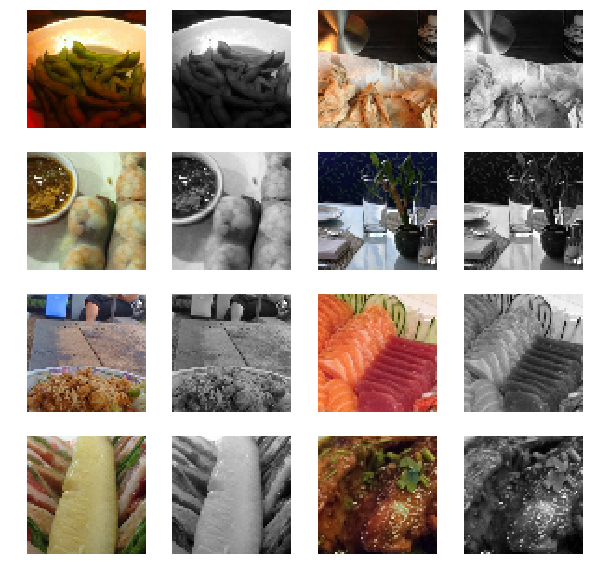

In [95]:
plt.show()

## 2.2 Linearize the images to create a table of 1-D image features. 

### Save 10099 images in a dataframe. Each image has 4096 columns.

In [6]:
img_data = np.zeros((10099, 4096))
for i in range(size):
    img = mpimg.imread('food/' + str(i) + '.png')     
    gray = rgb2gray(img)
    farr = gray.flatten()
    img_data[i] = farr

In [7]:
df = pd.DataFrame(img_data)

In [97]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0.125663,0.113898,0.117776,0.113898,0.117863,0.138153,0.133059,0.118780,0.124278,0.129694,...,0.054573,0.058773,0.062694,0.062694,0.058941,0.055745,0.052592,0.105098,0.172008,0.151827
1,0.231765,0.290933,0.342537,0.380345,0.344047,0.339804,0.310302,0.290878,0.313039,0.341467,...,0.287529,0.349726,0.400071,0.556859,0.886902,0.795533,0.697835,0.341835,0.774016,0.781384
2,0.423992,0.427400,0.452271,0.446965,0.447859,0.471624,0.502996,0.512349,0.545129,0.552627,...,0.753106,0.752447,0.752835,0.748341,0.730102,0.667765,0.585396,0.536357,0.486271,0.505725
3,0.097659,0.107098,0.095353,0.093902,0.105710,0.094137,0.098573,0.090816,0.074851,0.199243,...,0.356710,0.375871,0.339894,0.347737,0.347737,0.347737,0.317326,0.346227,0.306118,0.294118
4,0.536973,0.566188,0.518067,0.513082,0.518067,0.515039,0.534647,0.528871,0.509157,0.493796,...,0.308882,0.341039,0.293086,0.214075,0.341341,0.336439,0.411059,0.430945,0.463169,0.478659


### Save category information in a dataframe. 

At first the category information are stored in a (10099, 101) array using value of True of False to identify which category each food belongs to, now we want to change it in to a 10099 × 1 array, using value from 1 to 101 to represent what kind of category each food belongs to.

In [9]:
new_cat = np.zeros(10099)
for i in range(size):
    row = category[i]
    for j in range(len(row)):
        if(row[j]):
            new_cat[i] = j
            break
new_cat

array([ 33.,  53.,  92., ...,  30.,  87.,  15.])

In [85]:
category_name[33] 

b'edamame'

We can now clearly see that the first image of food belongs to type #33 edamamer, and so on. Compare to the image showed above, it matches.



## 2.3 Visualize several images

In [87]:
# Use a function called plot gallery to display some images.
# Reference from https://github.com/eclarson/MachineLearningNotebooks/blob/master/04.%20Dimension%20Reduction%20and%20Images.ipynb

plt.rcParams['figure.figsize'] = (10.0, 10.0)

def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i+1)
        try:
            plt.imshow(images.iloc[i].values.reshape(h,w), cmap=plt.cm.gray)
        except:
            plt.imshow(images[i].reshape(h,w), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())
        
    plt.show()

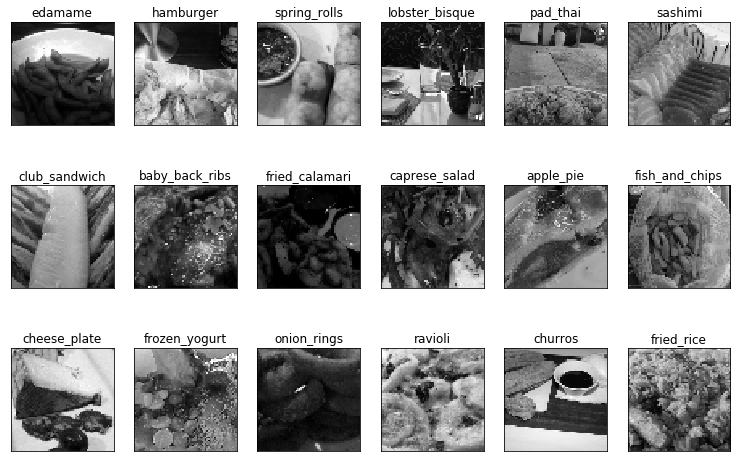

In [102]:
labels = [str(category_name[int(new_cat[i])],'utf-8') for i in range(new_cat.shape[0])]
                
plot_gallery(df, labels, 64, 64)

# 3 Data Reduction

## 3.1 Linear dimensionality reduction --- Full PCA

In [107]:
# Use a function called plot_explained_variance to show percentage and accumulate percentage of 
# variance explained by each of the selected components after using Principle Component Analysis.
# Reference from https://github.com/eclarson/MachineLearningNotebooks/blob/master/04.%20Dimension%20Reduction%20and%20Images.ipynb

def plot_explained_variance(pca):
    plotly.offline.init_notebook_mode() 
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })

##### Get some of the specifics of the dataset


In [104]:
X = df
y = new_cat
names = category_name

n_samples, n_features = X.shape
n_classes = len(category_name)
h = images.shape[1]
w = images.shape[2]

print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print("Original Image Sizes {} by {}".format(h,w))
print (64*64) 

n_samples: 10099
n_features: 4096
n_classes: 101
Original Image Sizes 64 by 64
4096


In [106]:
n_components = 1000
print ("Extracting the top %d components from %d foods" % (
    n_components, X.shape[0]))

pca = PCA(n_components)
%time pca.fit(X.copy())
eigenfood = pca.components_.reshape((n_components, 64, 64))

Extracting the top 1000 components from 10099 foods
CPU times: user 43.8 s, sys: 1.17 s, total: 45 s
Wall time: 17.1 s


In [14]:
eigenfood.shape

(1000, 64, 64)

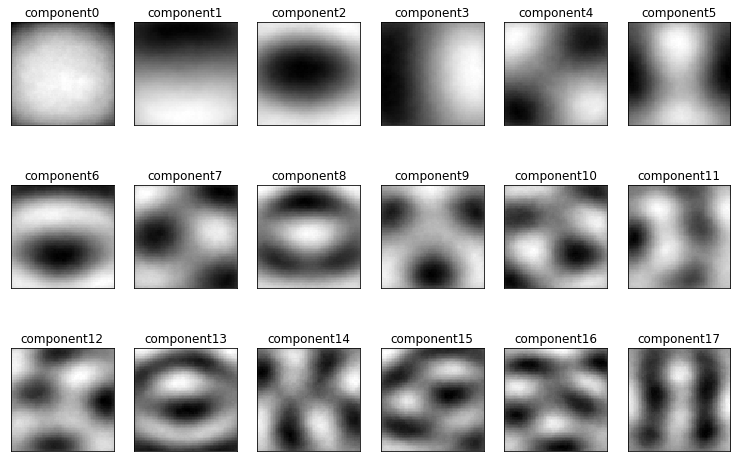

In [117]:
eigenlabels = ['component' + str(i) for i in range(eigenfood.shape[0])]
plot_gallery(eigenfood, eigenlabels, 64, 64)

We can get NOTHING from the images of the 1000 components, eigenfood is not like eigenface or eigenmonkey which are basically of the same shape, the shape of the food different too much from each other. 

##### Visualize the explained variance of each component

In [118]:
plot_explained_variance(pca)

It's a judgement call, we choose to use 1000 components to represent the images. As we can see in the visualization of principal components and accumulated explained variance ratio, the first 5 principle components can represent 52% of our data, that's not good. We can capture 90% variance in a given image using about 320 components, that's adequate, we've tried using 320 components and reconstruct a image, the images seems a little blurry but we can still tell from it what it is, however, we can represent 95.6% of our data using 1000 components, so, why not when we can actually reconstruct a better one.

## 3.2 Linear dimensionality reduction --- Randomized PCA

In [18]:
n_components = 1000
print ("Extracting the top %d components from %d foods" % (
    n_components, X.shape[0]))

rpca = PCA(n_components=n_components,svd_solver='randomized')
%time rpca.fit(X.copy())
eigenfoods = rpca.components_.reshape((n_components, 64, 64))

Extracting the top 1000 components from 10099 foods
CPU times: user 42.8 s, sys: 877 ms, total: 43.6 s
Wall time: 16.9 s


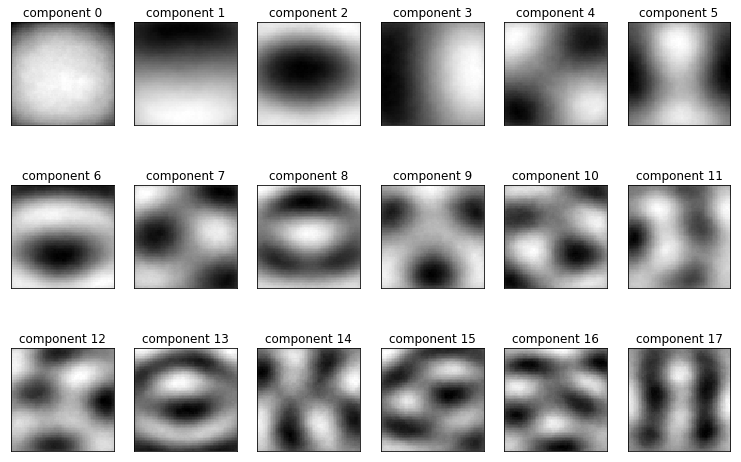

In [110]:
eigenfood_titles = ["component %d" % i for i in range(eigenfoods.shape[0])]
plot_gallery(eigenfoods, eigenfood_titles, 64, 64)

##### Visualize the explained variance of each component

In [116]:
plot_explained_variance(rpca)

## 3.3 Non-linear dimensionality reduction --- Kernel PCA

In [ ]:
%%time
n_components = 1000
print ("Extracting the top %d components from %d foods" % (n_components, X.shape[0]))
kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=True, gamma=15, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca.fit(X.copy())

In [ ]:
pickle.dump(kpca, open('food/data/kpca.p', 'wb' ))

Read from a file object we used to representation kpca before with pickel.dump and interpret it as a pickle data stream, so that we don't need to run KernelPCA everytime.

In [23]:
kpca_loaded = pickle.load(open( 'food/data/kpca.p', 'rb' ))

## 3.4 Compare the representation

##### Print images reconstruct from pca, rpca and kernel pca in a row, to compare their performance.

In [154]:
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.axis('off')
def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    des = X.iloc[idx_to_reconstruct].reshape(1, -1)
    reconstructed_image = pca.inverse_transform(pca.transform(des))
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(des))
    reconstructed_image_kpca = kpca_loaded.inverse_transform(kpca_loaded.transform(des))
    
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,4,1)
    plt.imshow(X.iloc[idx_to_reconstruct].reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Original')
    plt.grid()
    
    plt.subplot(1,4,2)
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Full PCA')
    plt.grid()
    
    plt.subplot(1,4,3)
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Randomized PCA')
    plt.grid()
    
    plt.subplot(1,4,4)
    plt.imshow(reconstructed_image_kpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Kernel PCA')
    plt.grid()
    
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

A Jupyter Widget

<function __main__.plt_reconstruct>

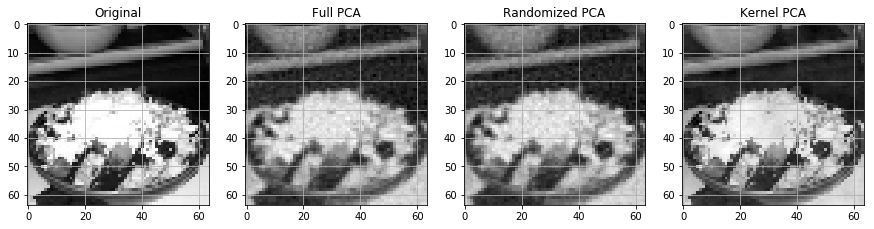

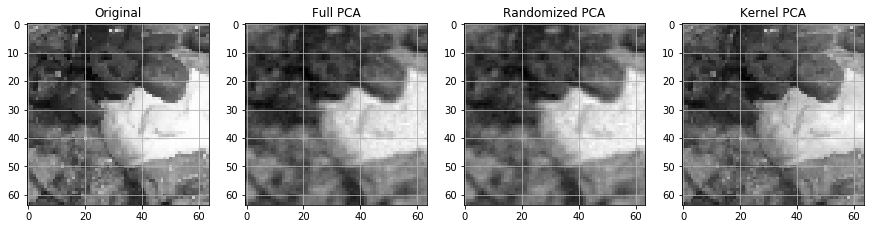

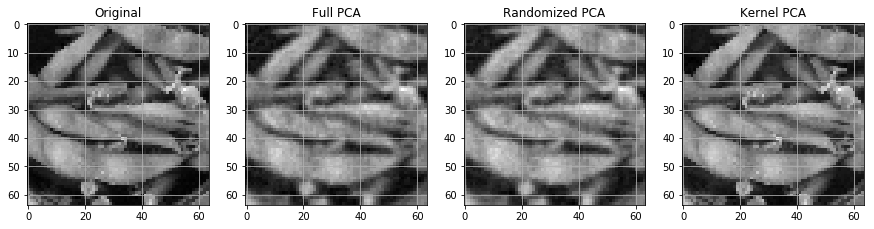

In [159]:
plt.show()

To compare the sharpness of these images using bare eyes, we can see when using 1000 principle components to represent a image kernel pca perform better than full pca or randomized pca for most of the time. Other two look gloomy and fuzzy.

Now we try to build a mean squared error matrix to quantitatively explain which method is better representing the images with fewer components(n_component = 320). The matrix we named msematrix should be a (10099, 3) matrix, wich each column represent Full PCA, Randomized PCA, Kernel PCA, and each value represent the mean squared error of a image(by row) of its original image and its reconstruct image after represented by these 3 methods. This mean squared error is calculated pixel by pixel, so if it's small, it means it's close to the original image and the principle component analysis method works well.

In [165]:
n_components_f = 320

pca_f = PCA(n_components_f)
%time pca_f.fit(X.copy())

CPU times: user 21.7 s, sys: 890 ms, total: 22.6 s
Wall time: 8.14 s


PCA(copy=True, iterated_power='auto', n_components=320, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [166]:
rpca_f = PCA(n_components=n_components_f,svd_solver='randomized')
%time rpca_f.fit(X.copy())

CPU times: user 21.8 s, sys: 747 ms, total: 22.5 s
Wall time: 8.57 s


PCA(copy=True, iterated_power='auto', n_components=320, random_state=None,
  svd_solver='randomized', tol=0.0, whiten=False)

In [167]:
kpca_f = KernelPCA(n_components=n_components_f, kernel='rbf', 
                fit_inverse_transform=True, gamma=15, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca_f.fit(X.copy())

KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=True, gamma=15, kernel='rbf',
     kernel_params=None, max_iter=None, n_components=320, n_jobs=1,
     random_state=None, remove_zero_eig=True, tol=0)

In [168]:
pickle.dump(kpca_f, open( 'food/data/kpca_f.p', 'wb' ))

In [169]:
kpca_f_loaded = pickle.load(open('food/data/kpca_f.p', 'rb' ))

In [182]:
msematrix = np.zeros((10099, 3))

def img_mse(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    des = X.iloc[idx_to_reconstruct].reshape(1, -1)
    reconstructed_image = pca.inverse_transform(pca.transform(des)).T.ravel()
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(des)).T.ravel()
    reconstructed_image_kpca = kpca_loaded.inverse_transform(kpca_loaded.transform(des)).T.ravel()
    msematrix[idx_to_reconstruct][0] = mean_squared_error(X.iloc[idx_to_reconstruct], reconstructed_image)
    msematrix[idx_to_reconstruct][1] = mean_squared_error(X.iloc[idx_to_reconstruct], reconstructed_image_rpca)
    msematrix[idx_to_reconstruct][2] = mean_squared_error(X.iloc[idx_to_reconstruct], reconstructed_image_kpca)

for i in range(10099):    
    img_mse(i)

/Applications/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning:

reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead



In [189]:
msematrix

array([[ 0.00152494,  0.00154248,  0.05950704],
       [ 0.00260519,  0.00263459,  0.12846299],
       [ 0.00183293,  0.00179652,  0.0816619 ],
       ..., 
       [ 0.00339672,  0.00337401,  0.0192922 ],
       [ 0.00189918,  0.00190118,  0.0164293 ],
       [ 0.00394122,  0.00389921,  0.02325981]])

In [190]:
pltdf = pd.DataFrame(msematrix)

In [191]:
pltdf.T

,0,1,2,3,4,5,6,7,8,9,...,10089,10090,10091,10092,10093,10094,10095,10096,10097,10098
0,0.001525,0.002605,0.001833,0.004246,0.003246,0.002372,0.001383,0.003271,0.000998,0.001558,...,0.002396,0.002624,0.003377,0.003153,0.003970,0.002328,0.002546,0.003397,0.001899,0.003941
1,0.001542,0.002635,0.001797,0.004226,0.003209,0.002379,0.001406,0.003329,0.001000,0.001535,...,0.002352,0.002698,0.003239,0.003156,0.003910,0.002392,0.002521,0.003374,0.001901,0.003899
2,0.059507,0.128463,0.081662,0.048164,0.048760,0.021677,0.012123,0.005744,0.005519,0.004840,...,0.039198,0.023342,0.029124,0.017234,0.138175,0.005271,0.034812,0.019292,0.016429,0.023260


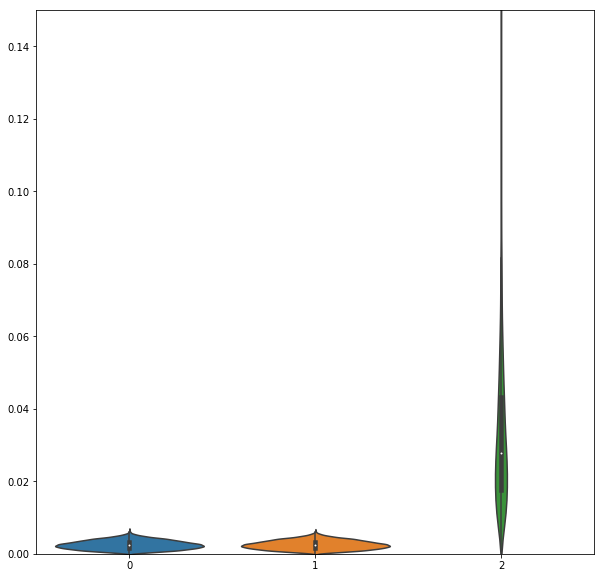

In [215]:
sns.violinplot(data=pltdf)
plt.ylim(0,0.15)
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.show()

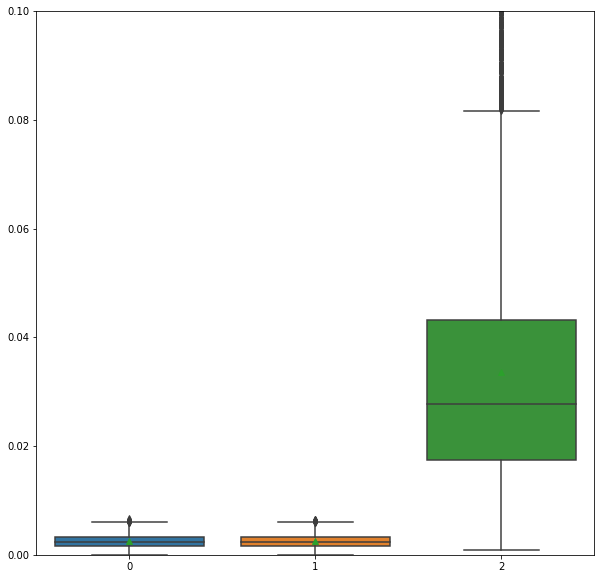

In [218]:
sns.boxplot(data=pltdf, meanline=False, showmeans=True)
plt.ylim(0,0.10)
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.show()

The main idea of Kernel PCA is in some situation we can map instances of data from the original lower-dimensional linear space into high-dimensional space, and in that space we apply PCA algorithm by 'kernel trick' since we don't know the exact number of dimension that Hilbert space have, so we define a 'Kernel Matrix' and through the 'Kernel Matrix' we can calculate the eigen-vector and eigen-value of the high-dimensional space without the explicit calculation of the co-variance matrix of the Hilbert space.

When we using 1000 components to represent the data, the image reconstructed by KPCA seems good, but mean squared error is sometimes 10 times bigger than the others, when we using 320 components, from the two plots we can get, KPCA is still have a bigger MSE than PCA and RPCA. It has bigger mean value and most of the MSE value is bigger than other method's max value. Quantitatively,KPCA did the worst job.

## 3.5 Feature Extraction with DAISY

In [170]:
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape),step=10, radius=10, rings=2, histograms=6, orientations=8, visualize=False)
    return feat.reshape((-1))

In [171]:
# apply to entire data, row by row,
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: user 52.5 s, sys: 473 ms, total: 53 s
Wall time: 53.2 s
(10099, 2600)


DAISY is a efficient dense descriptor implement making the image convolved with Gaussian kernel function and then calculate the projection of gradient of each pixel according to the descriptor on different orientation. And the feature of extracted by this algorithm is essentially a vector and in this vector each elements are scalar of gradient of some pixels projects onto some specific orientation. 
In this case we choose step=10, radius = 10 to make more overlap over the image, so it can works better in feature extraction. In this case, we extract 2600 features for each image.

## 3.6 Nearest neighbor classifier

In [172]:
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

CPU times: user 12.1 s, sys: 248 ms, total: 12.4 s
Wall time: 4.59 s


In [197]:
# put it together inside a nice widget
plt.rcParams['figure.figsize'] = (10.0, 1.0)
plt.axis('off')
def closest_image(dmat,idx1):
    distances = copy.deepcopy(dmat[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    
    distances[idx2] = np.infty
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    imshow(X.iloc[idx1].reshape((h,w)))
    plt.title("Original : "+str(category_name[int(y[idx1])], 'utf-8'))
    plt.grid()

    plt.subplot(1,3,2)
    imshow(X.iloc[idx2].reshape((h,w)))
    plt.title("Closest : "+str(category_name[int(y[idx2])], 'utf-8'))

    plt.grid()
    
    plt.subplot(1,3,3)
    imshow(X.iloc[idx3].reshape((h,w)))    
    plt.title("Next Closest : "+str(category_name[int(y[idx3])], 'utf-8'))
    plt.grid()
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),dmat=fixed(dist_matrix),__manual=True)

A Jupyter Widget

<function __main__.closest_image>

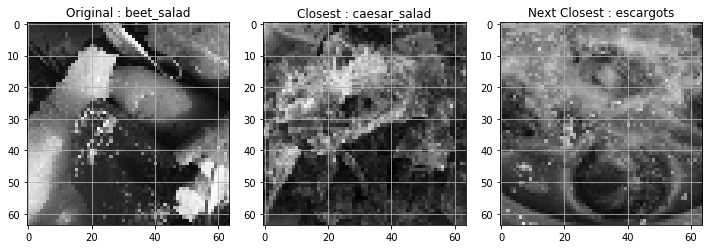

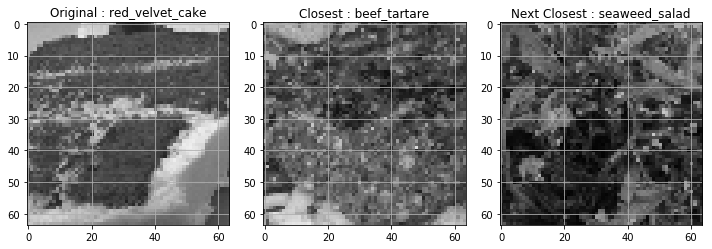

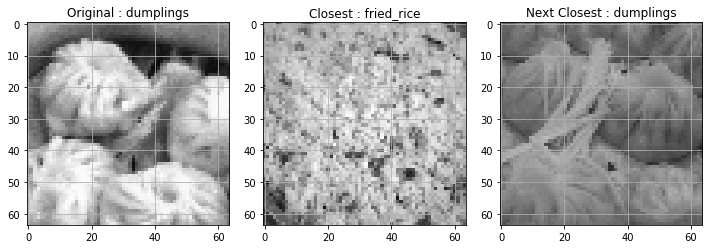

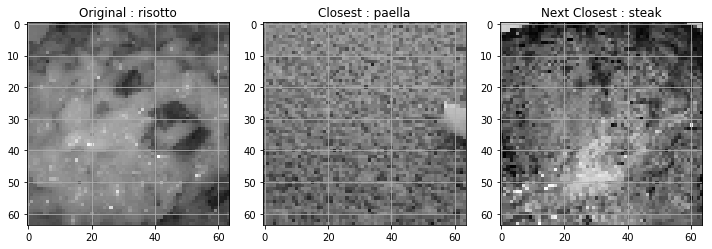

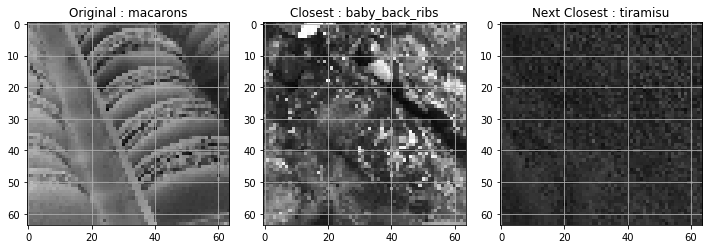

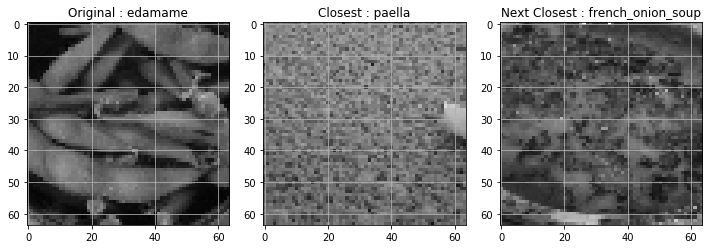

In [206]:
plt.show()

We can see from the images, the closest image to beet_salad is caesar_salad, one image of dumplings find its second closest image is also dumplings! But sadly, other results are terrible, that's basically because different kinds of food still can look similar, porridge can look like soup, different kinds of cake can look similar. Also, there's a high probability that DAISY captured not the food but the container of the food, that makes everything contained in similar white bowl tend to divided into one category.
But this is still a satisfied result. DAISY extracted some really good features, the 10099 images are notable divided based on graininess or shape in real world.

## 3.7 Heatmap of the pairwise differece

In our dataset, we have 101 kinds of food, that makes it hard to build a heatmap among each of the categories to compare pairwise difference, but we still want to see how it works.

We categorized the foods and stored it in a dictionary by category.

In [207]:
idic = {}

for i in range(size):
    ci = new_cat[i]
    tmparray = []
    li = idic.get(ci, tmparray)
    tmprow = df.iloc[i]
    li.append(tmprow)
    #newarr = np.concatenate(li, tmprow)
    idic[ci] = li

In [208]:
print(idic.keys())

dict_keys([33.0, 53.0, 92.0, 60.0, 70.0, 86.0, 25.0, 1.0, 43.0, 13.0, 0.0, 38.0, 16.0, 45.0, 68.0, 82.0, 23.0, 44.0, 30.0, 31.0, 19.0, 77.0, 83.0, 55.0, 89.0, 8.0, 98.0, 22.0, 35.0, 72.0, 57.0, 42.0, 11.0, 97.0, 59.0, 62.0, 39.0, 24.0, 26.0, 50.0, 87.0, 81.0, 2.0, 69.0, 90.0, 91.0, 67.0, 10.0, 40.0, 73.0, 36.0, 28.0, 27.0, 85.0, 46.0, 5.0, 15.0, 95.0, 34.0, 100.0, 71.0, 47.0, 84.0, 64.0, 49.0, 61.0, 32.0, 4.0, 48.0, 99.0, 52.0, 63.0, 6.0, 9.0, 7.0, 41.0, 3.0, 88.0, 78.0, 54.0, 29.0, 75.0, 56.0, 93.0, 94.0, 66.0, 65.0, 76.0, 14.0, 37.0, 80.0, 21.0, 74.0, 20.0, 12.0, 51.0, 58.0, 17.0, 96.0, 79.0, 18.0])


In [209]:
# Let's see how many foods belong to category #1.
tmp = np.asarray(idic.get(1))
tmp.shape

(102, 4096)

In [210]:
tmpdf = pd.DataFrame(tmp)
tmpdf

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0.752239,0.722063,0.694451,0.677796,0.626463,0.540318,0.317255,0.236278,0.199129,0.293906,...,0.121020,0.110149,0.067376,0.106035,0.049851,0.024357,0.018792,0.028980,0.015192,0.027067
1,0.341486,0.377118,0.388737,0.095976,0.225106,0.176263,0.141404,0.206878,0.136969,0.102192,...,0.159769,0.287224,0.130827,0.200435,0.148090,0.165635,0.119600,0.305294,0.122729,0.168686
2,0.340169,0.284886,0.242718,0.422824,0.550024,0.534035,0.405627,0.254071,0.430314,0.463580,...,0.969141,0.716906,0.828733,0.822957,0.744526,0.702282,0.609126,0.607271,0.486553,0.580157
3,0.785369,0.724910,0.596933,0.338431,0.245698,0.285427,0.259173,0.239690,0.372769,0.517824,...,0.067294,0.051608,0.034875,0.047769,0.056573,0.094980,0.070835,0.082600,0.122820,0.099890
4,0.689467,0.783298,0.501149,0.693357,0.862125,0.332475,0.172588,0.207851,0.208788,0.239502,...,0.192616,0.200353,0.212969,0.162984,0.161212,0.146459,0.141192,0.125098,0.094976,0.086000
5,0.388894,0.400659,0.468220,0.508906,0.467090,0.517455,0.536169,0.530071,0.465875,0.456133,...,0.283608,0.325808,0.360275,0.391882,0.405435,0.384824,0.341173,0.200714,0.117071,0.077702
6,0.360196,0.581020,0.663153,0.128584,0.626859,0.148733,0.086553,0.177353,0.252510,0.395690,...,0.312933,0.256027,0.412361,0.493918,0.545212,0.736714,0.786631,0.770945,0.659396,0.779749
7,0.455569,0.240820,0.119953,0.133549,0.126133,0.121333,0.216302,0.133486,0.136835,0.144678,...,0.137204,0.085988,0.070341,0.070827,0.062745,0.023251,0.055180,0.059102,0.074788,0.055180
8,0.670361,0.533761,0.444027,0.368067,0.387576,0.443565,0.377533,0.587439,0.728165,0.753404,...,0.227380,0.250533,0.270322,0.274537,0.246698,0.220227,0.207376,0.223729,0.232282,0.344698
9,0.682580,0.652086,0.716557,0.972463,0.973800,0.659624,0.728757,0.712216,0.673086,0.627376,...,0.656592,0.635886,0.663635,0.729129,0.607965,0.713890,0.406922,0.686376,0.588659,0.725106


In [211]:
tmparr = []

for i in range(101):
    cur_feature = np.mean(np.apply_along_axis(apply_daisy, 1, idic.get(i), (64,64)), axis=0).reshape((1,2600)).ravel()
    tmparr.append(cur_feature)

In [219]:
tmparr = np.asarray(tmparr)
tmparr.shape

(101, 2600)

In [220]:
dist_matrix_daisy = pairwise_distances(tmparr)
dist_matrix_daisy.shape

(101, 101)

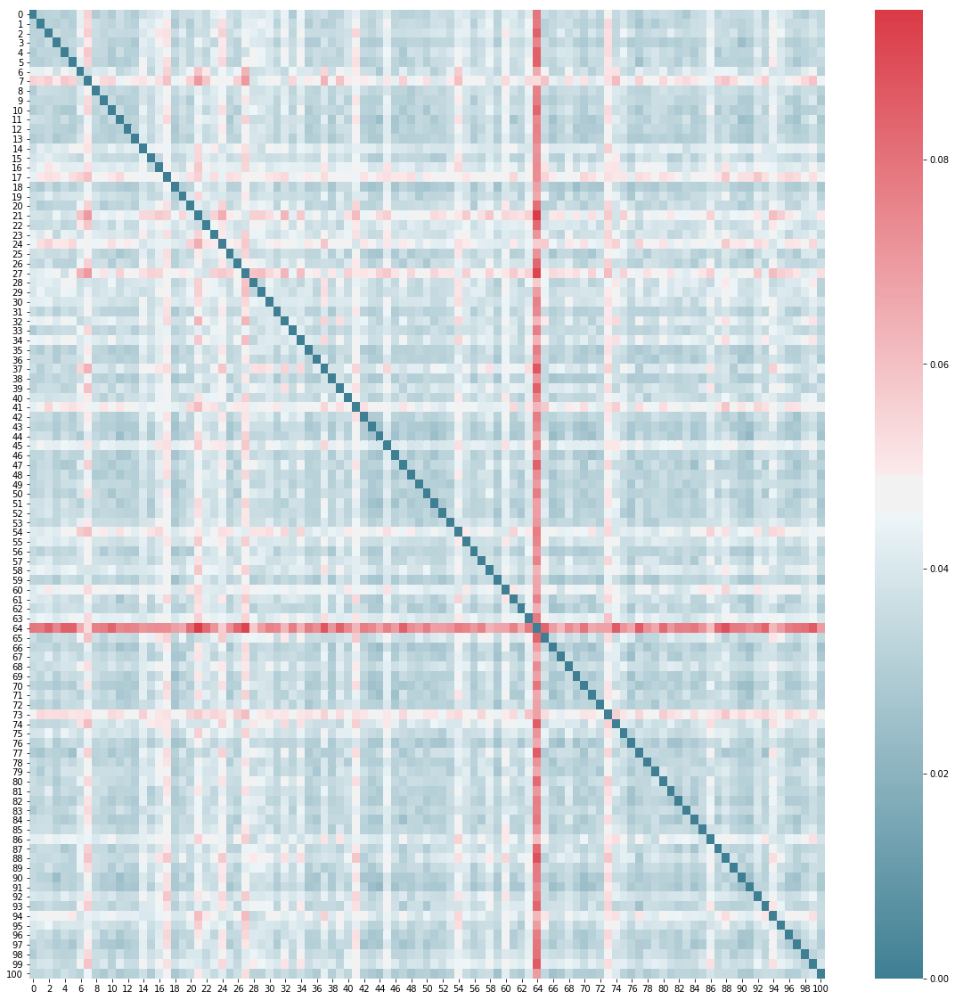

In [221]:
plt.rcParams['figure.figsize'] = (20.0, 20.0)
#plt.axis('off')

cmap = sns.diverging_palette(220, 10, as_cmap=True)
#sns.set(style="darkgrid")
#f, ax = plt.subplots(figsize=(50, 50))
sns.heatmap(dist_matrix_daisy, cmap=cmap)
#f.tight_layout()
plt.show()

We take the mean value of each column of each matrix of different kind of food, and then draw their pair-wise difference which is Euclidean Distance in linear space, and the plot above show the distance distribution. We can find that there is one type of food which has a big difference other foods among image. Let see what it is.

In [222]:
print(category_name[64])

b'miso_soup'


It turns out to be soup, that make sense because soup is liquid and others are mostly solid. Since the change of color is uniform, difference among other kind of food seems to be small compare to them with soup, that's why their colors are not to bright. To see whether there's also a big difference among other category of food, we only take 10 categories and build a heatmap.

In [223]:
tmparr10 = tmparr[0:10,:]

In [224]:
dist_matrix_daisy = pairwise_distances(tmparr10)
dist_matrix_daisy.shape

(10, 10)

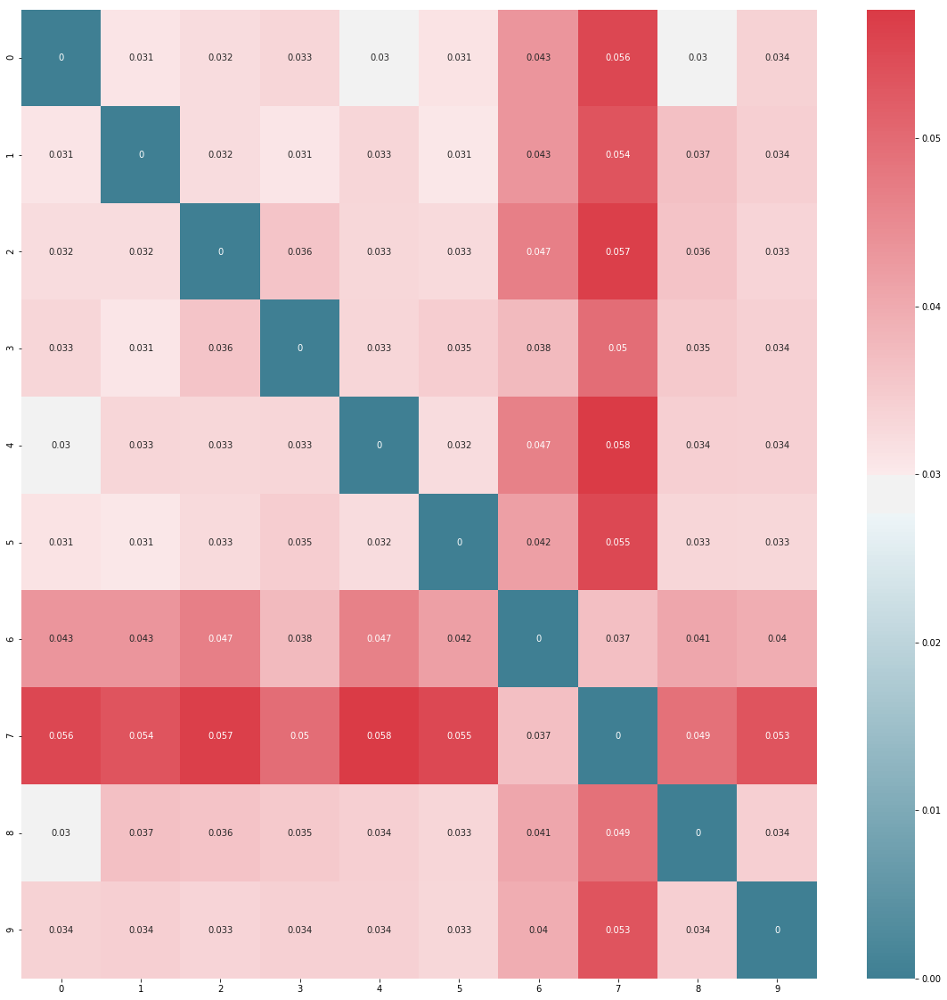

In [225]:
plt.rcParams['figure.figsize'] = (20.0, 20.0)
#plt.axis('off')

#cmap = sns.diverging_palette(220, 10, as_cmap=True)
#sns.set(style="darkgrid")
#f, ax = plt.subplots(figsize=(50, 50))
sns.heatmap(dist_matrix_daisy, cmap=cmap,annot=True)
#f.tight_layout()
plt.show()

The plot above show the distance distribution of the first 10 types of foods, according to the 2nd heat map, we can tell that the distance between different kinds of food is notable. It means there's some information contained in the pixel's gradient or textures of a image, that is, feature we extract from the images. So there's a chance that we can use those information to classify different kind of foods.

<h2>Histogram of Oriented Gradients</h2>

In [1]:
from skimage import feature
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

In [10]:
features_list = np.zeros((10099, 576))
features_label = np.zeros(10099)
for i in range(10099):
    img = mpimg.imread('food/' + str(i) + '.png')     
    gray = rgb2gray(img)
    h = feature.hog(gray, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(1, 1), transform_sqrt=True)
    features_list[i] = h
    features_label[i] = new_cat[i]

/Users/jianguo/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation:

Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15



Extracted 576 features for each image

In [11]:
features  = np.array(features_list, 'float64')
# split the labled dataset into training / test sets
X_train, X_test, y_train, y_test = train_test_split(features, features_label)

In [12]:
# train using K-NN
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
# get the model accuracy
model_score = knn.score(X_test, y_test)
print(model_score)

0.0134653465347


Applied K-NN, after trained with train data, I tested with test data, the model accuracy is 0.0134653465347, that is pretty similar to the previous conclusion, the foods' images is not easy to be categorized accurately.

/Users/jianguo/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation:

Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15



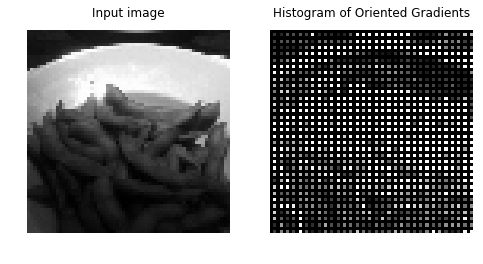

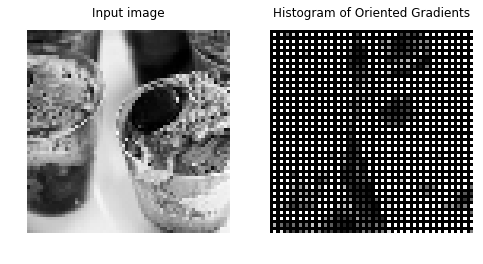

In [31]:
#Visualize the HOG 
image = rgb2gray(images[0])
fd, hog_image = feature.hog(image, orientations=9, pixels_per_cell=(2, 2),
                    cells_per_block=(1, 1), visualise=True)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, cmap=plt.cm.gray)
ax1.set_title('Input image')
ax1.set_adjustable('box-forced')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
ax1.set_adjustable('box-forced')

image = rgb2gray(images[100])
fd, hog_image = feature.hog(image, orientations=9, pixels_per_cell=(2, 2),
                    cells_per_block=(1, 1), visualise=True)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, cmap=plt.cm.gray)
ax1.set_title('Input image')
ax1.set_adjustable('box-forced')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
ax1.set_adjustable('box-forced')
plt.show()